# Twisted bilayer WSe$_2$ DFT 

## Lattice structure for $\sim 22$ degrees

We perform a DFT calculation of twisted bilayer WSe$_2$ at a twist angle of approximately 22 degrees. For a twist angle there are two possible ways of stacking the layers due to lack of $C_6$ symmetry of the monolayer: 
* Parallel stacking (P-WSe$_2$): here the layers can be translated in such a way that two metal atoms and two chalcogen atoms are vertically aligned. Inversion symmetry is broken for this stacking.

```{figure} logo.png
---
height: 0px
name: P_WSe_2
figclass: margin
---
P-WSe$_2$ where the cell border vertices correspond with two aligned metal atoms. Two chalcogen atoms align within the circle of metal atoms.
```

In [2]:
from moire.lattice import Lattice, Bilayer, Supercell
import numpy as np

In [17]:
m, n = 2, 1
Δz = 6.8
σ = 1
Se_dic_1 = dict(name='Se', color='blue', draw_radius=30, key='Se layer 1')
W_dic_1 = dict(name='W', color='red', draw_radius=50, key='W layer 1')
Se_dic_2 = dict(name='Se', color='lightblue', draw_radius=30, key='Se layer 2')
W_dic_2 = dict(name='W', color='firebrick', draw_radius=50, key='W layer 2')

lattice_1 = Lattice(3.325)
lattice_1.set_atom(np.array([0, 0, 0]), W_dic_1)
lattice_1.set_atom(np.array([0, 1.919689645, 1.67871166]), Se_dic_1)
lattice_1.set_atom(np.array([0, 1.919689645, -1.67871166]), Se_dic_1)
layer_1 = Supercell(lattice_1, m , n)
lattice_2 = Lattice(3.325)
lattice_2.set_atom(np.array([0, 0, Δz]), W_dic_2)
lattice_2.set_atom(np.array([0, σ*1.919689645, Δz+1.67871166]), Se_dic_2)
lattice_2.set_atom(np.array([0, σ*1.919689645, Δz-1.67871166]), Se_dic_2)
layer_1 = Supercell(lattice_1, m , n)
layer_2 = Supercell(lattice_2, n, m)
my_lattice = Bilayer(layer_1, layer_2)


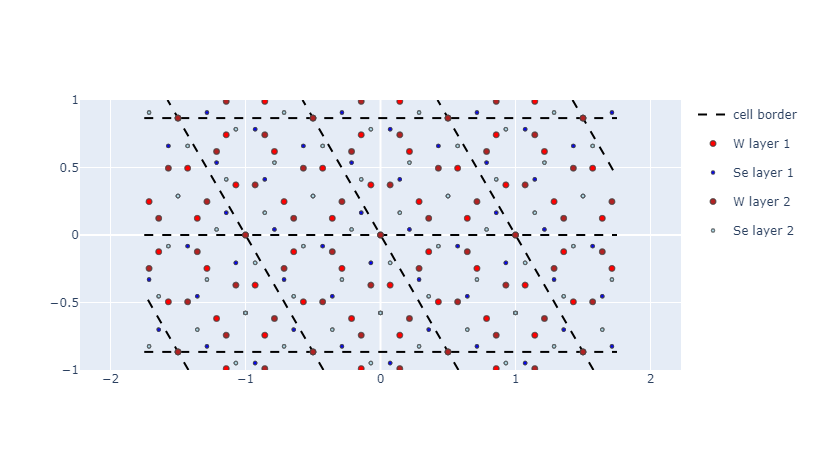

In [18]:
my_lattice.plot(3.5, 2, D=2, plot_3d=False, all=dict(showlegend=True))

* Anti-parallel stacking (AP-WSe$_2$): here no two chalcogen atoms align and inversion symmetry is obtained, a symmetry the normal monolayer does not have.

```{figure} logo.png
---
height: 0px
name: AP_WSe_2
figclass: margin
---
AP-WSe$_2$ where the cell border vertices correspond with two aligned metal atoms. No two chalcogen atoms align perfectly but each circle of metal atoms contains one chalcogen atom, allowing for inversion symmetry.
```

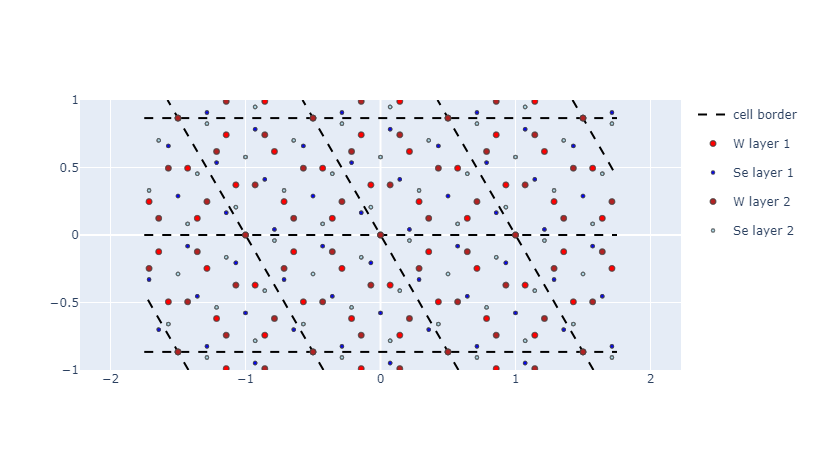

In [19]:
m, n = 2, 1
Δz = 6.8
σ = -1
Se_dic_1 = dict(name='Se', color='blue', draw_radius=30, key='Se layer 1')
W_dic_1 = dict(name='W', color='red', draw_radius=50, key='W layer 1')
Se_dic_2 = dict(name='Se', color='lightblue', draw_radius=30, key='Se layer 2')
W_dic_2 = dict(name='W', color='firebrick', draw_radius=50, key='W layer 2')

lattice_1 = Lattice(3.325)
lattice_1.set_atom(np.array([0, 0, 0]), W_dic_1)
lattice_1.set_atom(np.array([0, 1.919689645, 1.67871166]), Se_dic_1)
lattice_1.set_atom(np.array([0, 1.919689645, -1.67871166]), Se_dic_1)
layer_1 = Supercell(lattice_1, m , n)
lattice_2 = Lattice(3.325)
lattice_2.set_atom(np.array([0, 0, Δz]), W_dic_2)
lattice_2.set_atom(np.array([0, σ*1.919689645, Δz+1.67871166]), Se_dic_2)
lattice_2.set_atom(np.array([0, σ*1.919689645, Δz-1.67871166]), Se_dic_2)
layer_1 = Supercell(lattice_1, m , n)
layer_2 = Supercell(lattice_2, n, m)
my_lattice = Bilayer(layer_1, layer_2)

my_lattice.plot(3.5, 2, D=2, plot_3d=False, all=dict(showlegend=True))

## DFT

For the dft calculation we use the P-WSe$_2$ configuration of the bilayer. Before performing the calculation of the bands we perform a relax calculation. For both we use the software package Quantum Espresso (QE). QE also offers the possibility of projecting the standard atomic orbitals onto the wavefunctions. This we do to gain insight of the nature of the highest valence bands, which form the flat band at the magic twist angle.

```{figure} logo.png
---
height: 0px
name: projwfc_22
figclass: margin
---
The band structure of P-WSe_$2$ for a twist angle of $\sim$22 degrees. Like for the monolayer spin-orbit coupling (SOC) splits the valence band at the $K$ point. We show the contribution of the orbitals where we discern for the layer and spin nature.
```

In [21]:
from moire.dft import DFT
data_dir = '/home/hidde/hidde/Unige/dft/twb_21'
tb = DFT('tbwse2_21', data_dir, data_dir)
qe_dic = {}

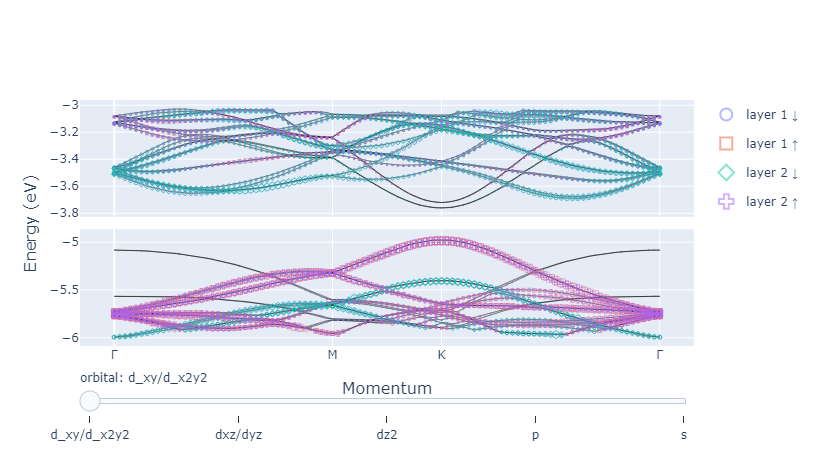

In [22]:
layer_1 = [i for i in range(7)] + [14 + i for i in range(14)]
layer_2 = [7 + i for i in range(7)] + [28 + i for i in range(14)]
orb_args = dict(orbital=[dict(l=2, m_l=2), dict(l=2, m_l=1), dict(l=2, m_l=0), dict(l=1), dict(l=0)])
elem_args = dict(elements=[dict(atoms=layer, m_s=m_s) for layer in [layer_1, layer_2] for m_s in [-0.5, 0.5]])
legend_tags = ['layer '+str(i)+' '+σ for i in [1, 2] for σ in ['↓', '↑']]
tb.plot_wfc(
    ε_range=[-6, -3], 
    k_tags=['Γ', 'M', 'K', 'Γ'], 
    k_list=[np.array([0, 0]), np.array([4*np.pi/3, 0]), np.array([np.pi, np.pi/np.sqrt(3)]), np.zeros(2)], 
    N_k=[40, 20, 40], 
    cut=-4, 
    legend=dict(args=elem_args, tags=legend_tags, auto_color=True, auto_symbol=True), 
    slider=dict(
        args=orb_args, 
        tags=['d_xy/d_x2y2', 'dxz/dyz', 'dz2', 'p', 's'], 
        prefix='orbital'), 
    size=40)

In figure {numref}`projwfc_22` we plot the bands with the percentile contribution of the atomic orbitals. The most striking feature of these bands is the degenerate nature of the top valence band. Degeneracy indicates that we can recombine the wavefunctions of these two bands such that each lives on its own layer and does not couple with the other. If it is this band that constitutes the flat band for smaller twist angle we can conclude that interlayer hopping does not contribute to the forming of the flat band.

The valence bands at the $K$ point with lower energy however do show clear signs of interlayer coupling. These bands are non-degenerate and as such must live on both layers. It is however unlikely that backfolding or interlayer coupling can compensate for the 0.5 eV deficit required for these bands to end up on top.